In [1]:
!pip install -Uq diffusers transformers fastcore

In [2]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

0it [00:00, ?it/s]

In [3]:
pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16",
    torch_dtype=torch.float16
).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [4]:
!ls ~/.cache/huggingface/hub

models--CompVis--stable-diffusion-v1-4	version_diffusers_cache.txt
version.txt


In [5]:
prompt = "a photograph of an astronaut riding a horse"

  0%|          | 0/50 [00:00<?, ?it/s]

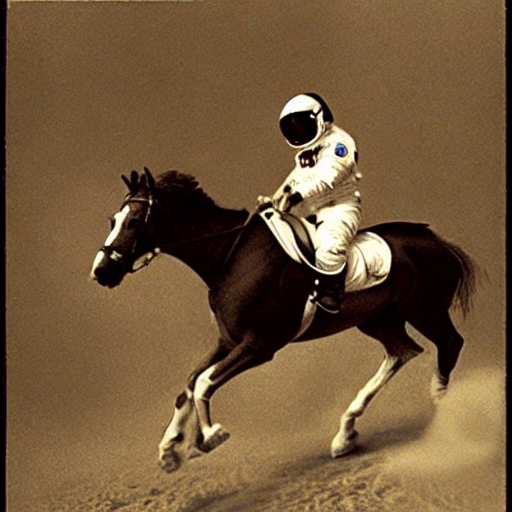

In [6]:
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

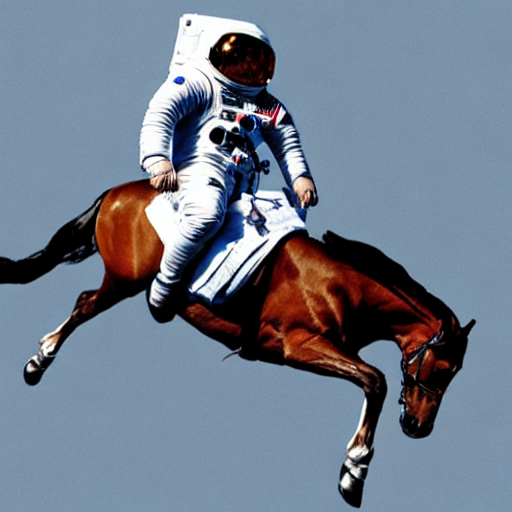

In [7]:
torch.manual_seed(1024)
pipe(prompt).images[0]

  0%|          | 0/3 [00:00<?, ?it/s]

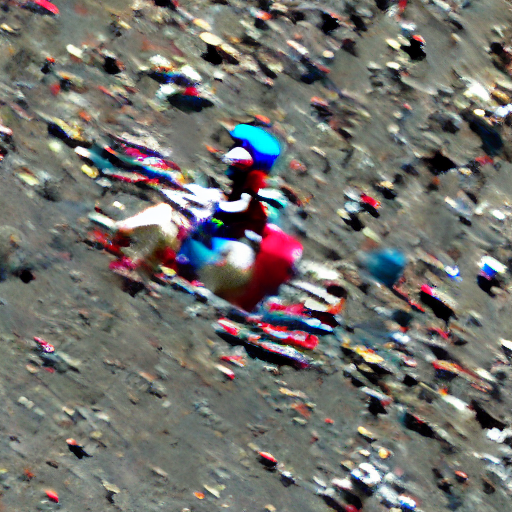

In [9]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=3).images[0]

  0%|          | 0/16 [00:00<?, ?it/s]

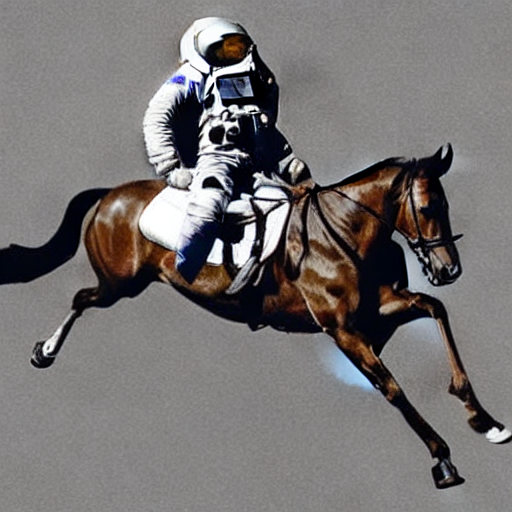

In [10]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=16).images[0]

## Classifier-Free Guidance

In [11]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [12]:
num_rows,num_cols=4,4
prompts = [prompt] * num_cols

In [13]:
images = concat(pipe(prompts, guidance_scale=g).images for g in [1.1, 3, 7, 14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

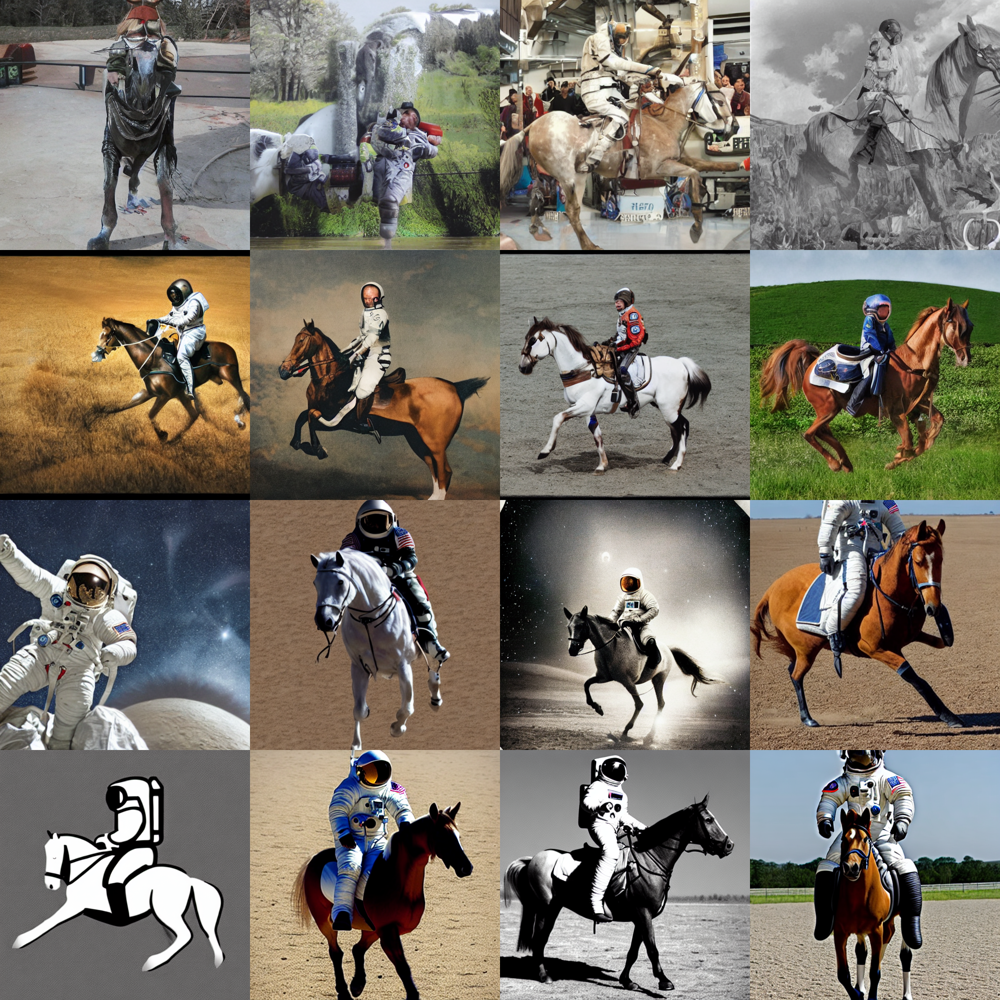

In [14]:
image_grid(images, rows=num_rows, cols=num_cols)

### Negative prompts

  0%|          | 0/50 [00:00<?, ?it/s]

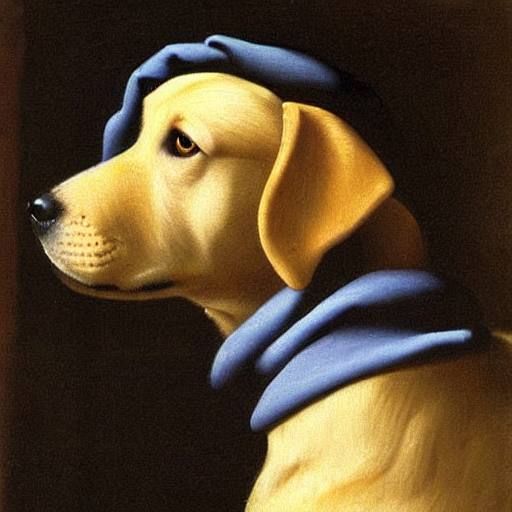

In [16]:
torch.manual_seed(1000)
prompt = "Labrador in the style of Vermeer"
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

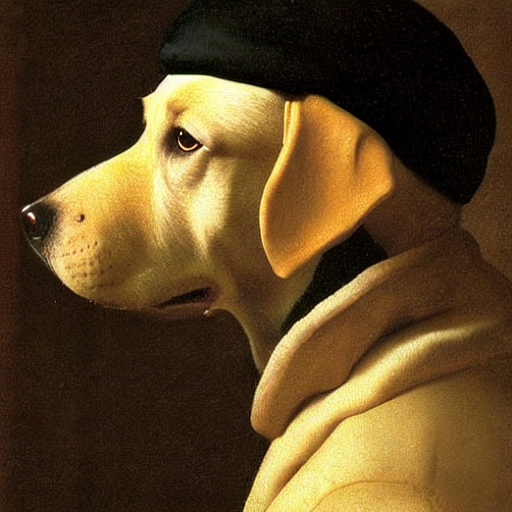

In [17]:
torch.manual_seed(1000)
prompt = "Labrador in the style of Vermeer"
pipe(prompt, negative_prompt="blue").images[0]

### Image to Image

In [18]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

In [27]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16",
    torch_dtype=torch.float16
).to('cuda')

/opt/conda/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


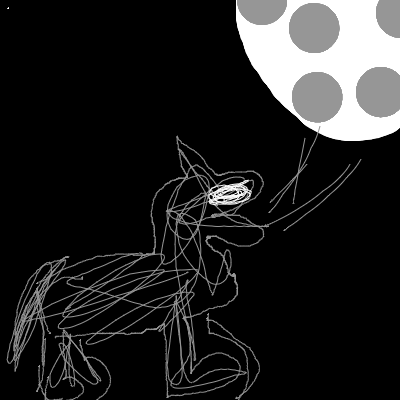

In [28]:
p = FastDownload().download('https://s3.amazonaws.com/moonup/production/uploads/1664665907257-noauth.png')
init_image = Image.open(p).convert('RGB')
init_image

/opt/conda/lib/python3.10/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:591: FutureWarning: You have passed 3 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/40 [00:00<?, ?it/s]

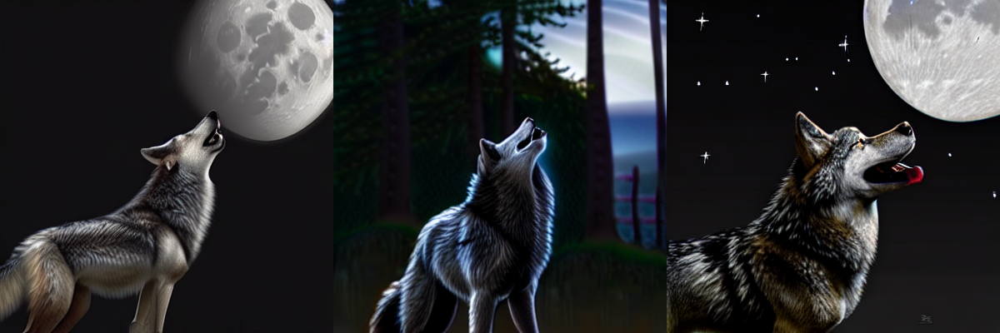

In [29]:
torch.manual_seed(1000)
prompt = "Wolf howling at the moon, photorealistic 4K"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=0.8, num_inference_steps=50).images
image_grid(images, rows=1, cols=3)

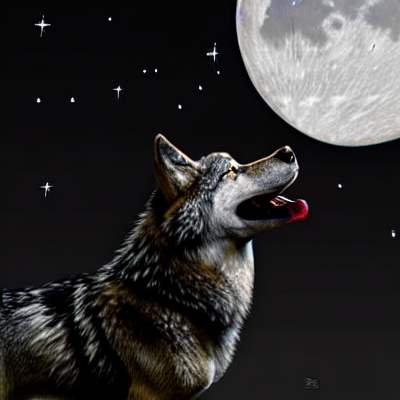

In [31]:
init_image = images[2]
init_image

/opt/conda/lib/python3.10/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:591: FutureWarning: You have passed 3 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/70 [00:00<?, ?it/s]

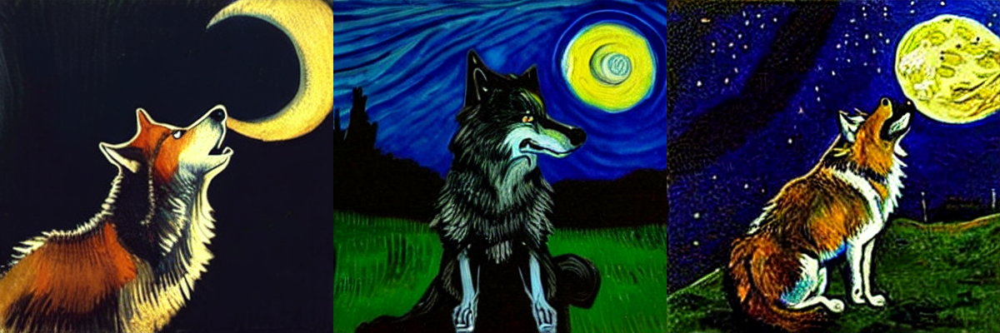

In [33]:
torch.manual_seed(1000)
prompt = "Oil painting of wolf howling at the moon by Van Gogh"
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=1, cols=3)

In [34]:
prompt

'Oil painting of wolf howling at the moon by Van Gogh'

### Textual Inversion

In [48]:
pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision='fp16',
    torch_dtype=torch.float16
).to('cuda')

In [49]:
embeds_url = "https://huggingface.co/sd-concepts-library/indian-watercolor-portraits/resolve/main/learned_embeds.bin"
embeds_path = FastDownload().download(embeds_url)
embeds_dict = torch.load(str(embeds_path), map_location="cpu")

In [50]:
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
new_token, embeds = next(iter(embeds_dict.items()))

In [51]:
text_encoder.dtype

torch.float16

In [52]:
embeds = embeds.to(text_encoder.dtype)
new_token

'<watercolor-portrait>'

In [53]:
len(tokenizer)

49408

In [54]:
assert tokenizer.add_tokens(new_token) == 1, "The token already exists!"

In [46]:
len(tokenizer)

49409

In [55]:
text_encoder.resize_token_embeddings(len(tokenizer))

Embedding(49409, 768)

In [56]:
new_token_id = tokenizer.convert_tokens_to_ids(new_token)
new_token_id

49408

In [59]:
print(text_encoder.get_input_embeddings())
print(type(text_encoder.get_input_embeddings().weight))
print(type(text_encoder.get_input_embeddings().weight.data))

Embedding(49409, 768)
<class 'torch.nn.parameter.Parameter'>
<class 'torch.Tensor'>


In [60]:
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

  0%|          | 0/50 [00:00<?, ?it/s]

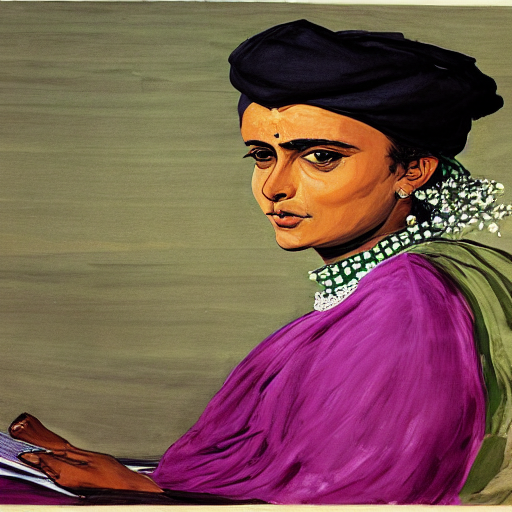

In [61]:
torch.manual_seed(1000)
image = pipe("Woman reading in style of <watercolor-portrait>").images[0]
image

### Dreambooth

In [62]:
pipe = StableDiffusionPipeline.from_pretrained("pcuenq/jh_dreambooth_1000", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

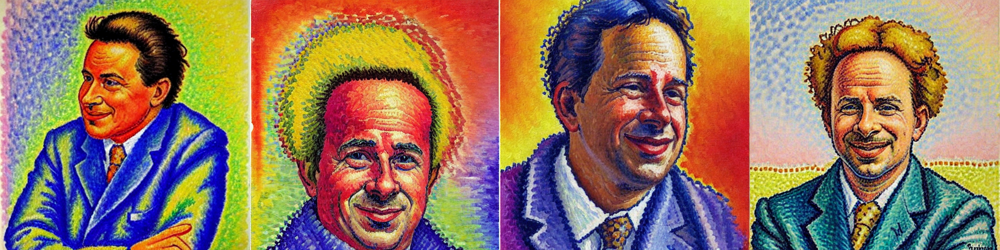

In [63]:
torch.manual_seed(1000)

prompt = "Painting of sks person in the style of Paul Signac"
images = pipe(prompt, num_images_per_prompt=4).images
image_grid(images, 1, 4)